# **Semantic Segmentation Competition (40%)**

For this competition, we will use a small autonomous driving dataset. The dataset contains 150 training images and 50 testing images. It can be download from https://drive.google.com/drive/folders/1UyGysAa9S7Jw-BRgouwNoSNgIZqEx7EX?usp=sharing or https://cloudstor.aarnet.edu.au/plus/s/qtk9MB74r0q1cVh

We provide a baseline by the following steps:

*    Loading the dataset using PyTorch.
*    Defining a simple convolutional neural network for semantic segmentation.
*    How to use existing loss function for the model learning.
*    Train the network on the training data.
*    Test the trained network on the testing data.

The following trick/tweak(s) could be considered:
-------
1. Data augmentation
2. Change of advanced training parameters: Learning Rate, Optimizer, Batch-size, and Drop-out. 
3. Architectural changes: Batch Normalization, Residual layers, Attention Block, and other varients.
4. Use of a new loss function.

Your code should be modified from the provided baseline. A pdf report is required to explain the tricks you employed, and the imporvements they achieved.
Marking Rules:
-------
We will mark the competition based on the final test accuracy on testing images and your report.

Final mark = acc_mark + efficiency mark + report mark + bonus mark
###Acc_mark 15:

We will rank all the submission results based on their test accuracy. The top 30% of the students will get full marks.


|Accuracy|Mark|
|---|---|
| Top 30% in the class|          15|
|30%-50%|         11|
|50%-80%  |        7|
| 80%-90%  |      3|
| 90%-100%  |      1|
|Not implemented| 0|

###Efficiency mark 5:

Efficiency is evaluated by the computational costs (flops: https://en.wikipedia.org/wiki/FLOPS). Please report the computational costs for your final model. We provide an evaluation code to calculate flops. 

|Efficiency|Mark|
|---|---|
| Top 30% in the class|          5|
|30%-50%|         4|
|50%-80%  |        3|
| 80%-90%  |      2|
| 90%-100%  |      2|
|Not implemented| 0|

###Report mark 20:
1. Introduction and your understanding to the baseline model: 2 points

2. Employed more than three tricks with ablation studies to improve the accuracy: 6 points

Clearly explain the reference, motivation and design choice for each trick/tweak(s). Providing the experimental results in tables.
Example table:

|Transfer learning|Learning Rate Scheduler|Class Balanced Loss|OHEM|Multiple Scale Training/Testing|auxiliary head|mIoU|
|---|---|---|---|---|---|---|
|N|N|N|N|N|N|61.41%|
|Y|N|N|N|N|N|68.31%|
|Y|Y|N|N|N|N|72.34%|
|Y|Y|Y|N|N|N|74.67%|
|Y|Y|Y|Y|N|N|75.98%|
|Y|Y|Y|Y|Y|N|78.12%|
|Y|Y|Y|Y|Y|Y|78.45%|



Observation and discussion based on the experiment results.

3. Expaination of the methods on reducing the computational cost and/or improve the trade-off between accuracy and efficiency: 4 points

4. Explaination of the code implementation：3 points

5. Visulization results: segmentation examples (color images) on test set: 3 points

6. Open ended:  Limitations, conclusions, failure cases analysis...: 2 points

###Bonus mark:
1. Top three results: 2 points
2. Fancy designs: 2 points

# 1. Download data and set configs

In [22]:
##################################################################################################################################
### Subject: Computer Vision 
### Year: 2022
### Student Name: Akide Liu, Zihan Wang
### Student ID: a1743748, a1810155
### Comptetion Name: Semantic Segmentation Competition
### Final Results: Please refer section 9 for our final results
### mIoU:  78.45%     FLOPs: 63.89G
##################################################################################################################################

In [23]:
from bridge.loader import *
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
# Some more magic so that the notebook will reload external python modules;
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## 1.1 download data

In [3]:
bridge = GlobalBridgeController()
bridge.download_data()

In [4]:
#1.2 Set configs
#Use Colab or install PyTorch 1.9 on your local machine to run the code.
import os
import numpy as np
import cv2

image_shape = (375, 1242)
evaluation_dir = 'data/kitti-seg-competition/output'
gt_dir = 'data/kitti-seg-competition/seg_data_processed/ann_dir/val'

## 1.2 dataset analysis

### 1.2.1 training data analysis

count pixels to analysis class distribution

count_array : [1.6410898e+07 2.6891160e+06 5.9890200e+06 6.4643100e+05 5.6673600e+05
 9.5088100e+05 2.1751900e+05 3.0758600e+05 2.0964413e+07 6.5226530e+06
 7.4905890e+06 6.1767000e+04 1.8689000e+04 4.0291390e+06 1.7601200e+05
 4.4351000e+04 1.3551000e+04 7.9010000e+03 4.4256000e+04]

 67151508.0

weights : [0.75952312 0.8523161  0.80858376 0.94312681 0.95249373 0.91668514
 1.02670926 0.99855901 0.74849044 0.8041853  0.79715573 1.14388026
 1.28290288 0.82965688 1.04470749 1.17929034 1.32624767 1.40595936
 1.17952672]


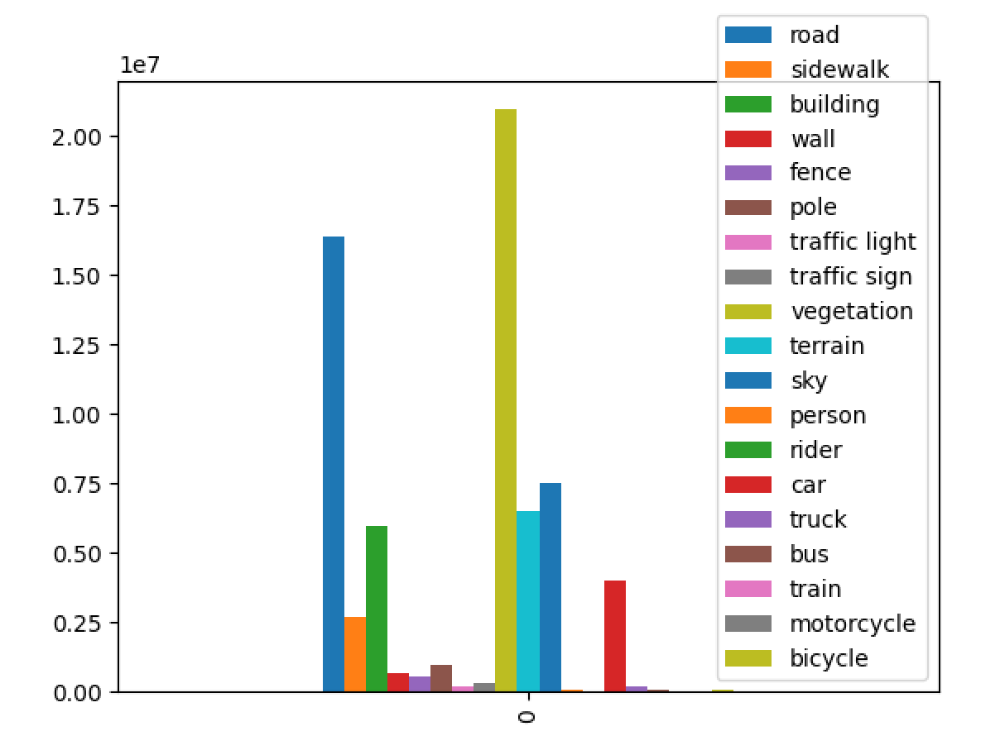

In [48]:
display_tool('https://minio.llycloud.com/image/uPic/image-20220622cJZ86g.png')

### 1.2.2 testing data analysis

count pixels to analysis class distribution

count_array : [5.096290e+06 8.719550e+05 1.605808e+06 2.090750e+05 2.106350e+05
 3.153820e+05 6.817700e+04 2.052120e+05 7.271193e+06 2.248570e+06
 2.443067e+06 2.550800e+04 7.121000e+03 1.567382e+06 3.231900e+04
 1.736700e+04 1.864200e+05 8.280000e+02 9.410000e+03] 0

22391719.0

weights : [0.74928016 0.84599227 0.80983893 0.94461    0.94403714 0.91394077
 1.03971502 0.94605021 0.73242514 0.79119748 0.78673501 1.14044977
 1.30447229 0.81121395 1.11445713 1.18535591 0.95353713 1.72195258
 1.2647391 ]

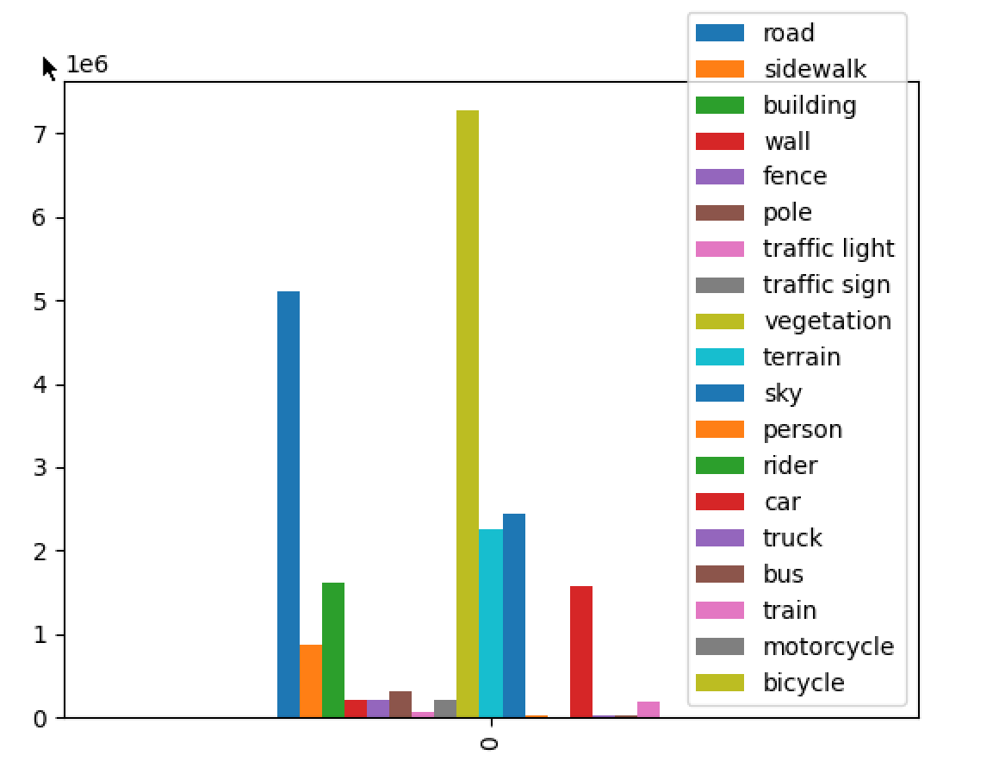

In [49]:
display_tool('https://minio.llycloud.com/image/uPic/image-20220622fCcxPd.png')

# 2. The function used to compare the precision

In [12]:
#------------------Modification of this function is ***NOT*** allowed---------------
def cal_acc(pred_folder, gt_folder, classes=19):
    class AverageMeter(object):
        def __init__(self):
            self.reset()

        def reset(self):
            self.val, self.avg, self.sum, self.count = 0, 0, 0, 0

        def update(self, val, n=1):
            self.val = val
            self.sum += val * n
            self.count += n
            self.avg = self.sum / self.count

    def intersectionAndUnion(output, target, K, ignore_index=255):
        assert (output.ndim in [1, 2, 3])
        assert output.shape == target.shape
        output = output.reshape(output.size).copy()
        target = target.reshape(target.size)
        output[np.where(target == ignore_index)[0]] = ignore_index
        intersection = output[np.where(output == target)[0]]
        area_intersection, _ = np.histogram(intersection, bins=np.arange(K + 1))
        area_output, _ = np.histogram(output, bins=np.arange(K + 1))
        area_target, _ = np.histogram(target, bins=np.arange(K + 1))
        area_union = area_output + area_target - area_intersection
        return area_intersection, area_union, area_target

    data_list = os.listdir(gt_folder)
    intersection_meter = AverageMeter()
    union_meter = AverageMeter()
    target_meter = AverageMeter()
    for i, image_name in enumerate(data_list):
        pred = cv2.imread(os.path.join(pred_folder, image_name), cv2.IMREAD_GRAYSCALE)
        target = cv2.imread(os.path.join(gt_folder, image_name), cv2.IMREAD_GRAYSCALE)
        intersection, union, target = intersectionAndUnion(pred, target, classes)
        intersection_meter.update(intersection)
        union_meter.update(union)
        target_meter.update(target)
    iou_class = intersection_meter.sum / (union_meter.sum + 1e-10)
    mIoU = np.mean(iou_class)
    print('Eval result: mIoU {:.4f}.'.format(mIoU))
    return mIoU

# 3. Baseline model

## 3.1 Summarize the model

In [37]:
bridge = GlobalBridgeController()

baseline_config = bridge.MMSegConfig(
    model_name='baseline',
    config_file='configs/basicNet/basicnet_8x1_1024x1024_180e_kitti.py',
    checkpoint_url='http://vmv.re/q4OtB'
)


[DEBUG  ] run command: wget -nv http://vmv.re/q4OtB -O checkpoints/baseline.pth 
[DEBUG  ] -> exit status: 0 
[DEBUG  ] output:  
[DEBUG  ] error: Will not apply HSTS. The HSTS database must be a regular and non-world-writable file.
ERROR: could not open HSTS store at '/home/akide/.wget-hsts'. HSTS will be disabled.
2022-06-22 18:14:52 URL:https://wthy4-my.sharepoint.com/personal/cloudreve_o365_llycloud_com/_layouts/15/download.aspx?UniqueId=1bd2371e-20ff-42ff-aaf1-d4ce99b2fae0&Translate=false&tempauth=eyJ0eXAiOiJKV1QiLCJhbGciOiJub25lIn0.eyJhdWQiOiIwMDAwMDAwMy0wMDAwLTBmZjEtY2UwMC0wMDAwMDAwMDAwMDAvd3RoeTQtbXkuc2hhcmVwb2ludC5jb21ANzNhY2M4ZGItNTIzMC00ODdiLWI5OTUtYjJiOTkwMTE4Mjc2IiwiaXNzIjoiMDAwMDAwMDMtMDAwMC0wZmYxLWNlMDAtMDAwMDAwMDAwMDAwIiwibmJmIjoiMTY1NTg4NzMyMCIsImV4cCI6IjE2NTU4OTA5MjAiLCJlbmRwb2ludHVybCI6InRXdjNsZ2UxdEcweTBrZVFhaXprQS9Nb1BQZ2kxVnlxZ1IzSUx2NE9Ycm89IiwiZW5kcG9pbnR1cmxMZW5ndGgiOiIxNTYiLCJpc2xvb3BiYWNrIjoiVHJ1ZSIsImNpZCI6Ik5USmpabUl5WldVdE5HUTRNQzAwTldSaUxUa3pOamt0WldSa09U

In [38]:
bridge.summarize_network(
    baseline_config.config_file, image_shape)

Layer (type:depth-idx)                   Output Shape              Param #
EncoderDecoder                           [1, 19, 375, 1242]        --
├─BasicSegNet: 1-1                       [1, 19, 22, 76]           --
│    └─Conv2d: 2-1                       [1, 64, 375, 1242]        1,792
│    └─ReLU: 2-2                         [1, 64, 375, 1242]        --
│    └─Conv2d: 2-3                       [1, 64, 375, 1242]        36,928
│    └─ReLU: 2-4                         [1, 64, 375, 1242]        --
│    └─MaxPool2d: 2-5                    [1, 64, 188, 621]         --
│    └─Conv2d: 2-6                       [1, 128, 188, 621]        73,856
│    └─ReLU: 2-7                         [1, 128, 188, 621]        --
│    └─MaxPool2d: 2-8                    [1, 128, 94, 311]         --
│    └─Conv2d: 2-9                       [1, 256, 94, 311]         295,168
│    └─ReLU: 2-10                        [1, 256, 94, 311]         --
│    └─MaxPool2d: 2-11                   [1, 256, 47, 156]         --

## 3.2 Training the model

In [35]:
bridge.train_network(baseline_config.config_file)

2022-06-21 21:45:19,202 - mmseg - INFO - Loaded 150 images
INFO:mmseg:Loaded 150 images
2022-06-21 21:45:19,204 - mmseg - INFO - Loaded 50 images
INFO:mmseg:Loaded 50 images
2022-06-21 21:45:19,292 - mmseg - INFO - Loaded 50 images
INFO:mmseg:Loaded 50 images
2022-06-21 21:45:19,293 - mmseg - INFO - Start running, host: akide@MS-7D31, work_dir: /home/akide/PycharmProjects/Road_Segmentation/work_dirs/basicnet_8x1_1024x1024_180e_kitti
INFO:mmseg:Start running, host: akide@MS-7D31, work_dir: /home/akide/PycharmProjects/Road_Segmentation/work_dirs/basicnet_8x1_1024x1024_180e_kitti
2022-06-21 21:45:19,293 - mmseg - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) FixedLrUpdaterHook                 
(NORMAL      ) CheckpointHook                     
(LOW         ) EvalHook                           
(VERY_LOW    ) TextLoggerHook                     
 -------------------- 
before_train_epoch:
(VERY_HIGH   ) FixedLrUpdaterHook                 
(LOW         ) Ite

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 50/50, 57.3 task/s, elapsed: 1s, ETA:     0s

2022-06-21 21:46:38,549 - mmseg - INFO - per class results:
INFO:mmseg:per class results:
2022-06-21 21:46:38,551 - mmseg - INFO - 
+---------------+-------+-------+
|     Class     |  IoU  |  Acc  |
+---------------+-------+-------+
|      road     |  58.7 | 96.44 |
|    sidewalk   |  0.02 |  0.02 |
|    building   |  1.23 |  1.27 |
|      wall     |  0.0  |  0.0  |
|     fence     |  0.0  |  0.0  |
|      pole     |  0.0  |  0.0  |
| traffic light |  0.0  |  0.0  |
|  traffic sign |  0.0  |  0.0  |
|   vegetation  | 61.36 | 93.29 |
|    terrain    | 13.85 | 17.74 |
|      sky      | 59.28 | 75.32 |
|     person    |  0.0  |  0.0  |
|     rider     |  0.0  |  0.0  |
|      car      |  0.46 |  0.47 |
|     truck     |  0.0  |  0.0  |
|      bus      |  0.0  |  0.0  |
|     train     |  0.0  |  0.0  |
|   motorcycle  |  0.0  |  0.0  |
|    bicycle    |  0.0  |  0.0  |
+---------------+-------+-------+
INFO:mmseg:
+---------------+-------+-------+
|     Class     |  IoU  |  Acc  |
+-----

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 50/50, 64.0 task/s, elapsed: 1s, ETA:     0s

2022-06-21 21:47:59,103 - mmseg - INFO - per class results:
INFO:mmseg:per class results:
2022-06-21 21:47:59,104 - mmseg - INFO - 
+---------------+-------+-------+
|     Class     |  IoU  |  Acc  |
+---------------+-------+-------+
|      road     | 66.44 |  96.9 |
|    sidewalk   |  0.0  |  0.0  |
|    building   |  6.83 |  7.45 |
|      wall     |  0.0  |  0.0  |
|     fence     |  0.0  |  0.0  |
|      pole     |  0.0  |  0.0  |
| traffic light |  0.0  |  0.0  |
|  traffic sign |  0.0  |  0.0  |
|   vegetation  | 65.81 |  96.6 |
|    terrain    | 31.52 | 35.97 |
|      sky      | 82.85 | 90.66 |
|     person    |  0.0  |  0.0  |
|     rider     |  0.0  |  0.0  |
|      car      | 17.46 | 22.96 |
|     truck     |  0.0  |  0.0  |
|      bus      |  0.0  |  0.0  |
|     train     |  0.0  |  0.0  |
|   motorcycle  |  0.0  |  0.0  |
|    bicycle    |  0.0  |  0.0  |
+---------------+-------+-------+
INFO:mmseg:
+---------------+-------+-------+
|     Class     |  IoU  |  Acc  |
+-----

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 50/50, 61.5 task/s, elapsed: 1s, ETA:     0s

2022-06-21 21:49:20,780 - mmseg - INFO - per class results:
INFO:mmseg:per class results:
2022-06-21 21:49:20,781 - mmseg - INFO - 
+---------------+-------+-------+
|     Class     |  IoU  |  Acc  |
+---------------+-------+-------+
|      road     | 74.31 | 95.93 |
|    sidewalk   |  0.0  |  0.0  |
|    building   | 35.16 |  49.9 |
|      wall     |  0.0  |  0.0  |
|     fence     |  0.0  |  0.0  |
|      pole     |  0.0  |  0.0  |
| traffic light |  0.0  |  0.0  |
|  traffic sign |  0.0  |  0.0  |
|   vegetation  | 78.78 | 91.46 |
|    terrain    | 59.86 | 76.57 |
|      sky      | 80.98 | 83.05 |
|     person    |  0.0  |  0.0  |
|     rider     |  0.0  |  0.0  |
|      car      | 38.83 | 68.71 |
|     truck     |  0.0  |  0.0  |
|      bus      |  0.0  |  0.0  |
|     train     |  0.0  |  0.0  |
|   motorcycle  |  0.0  |  0.0  |
|    bicycle    |  0.0  |  0.0  |
+---------------+-------+-------+
INFO:mmseg:
+---------------+-------+-------+
|     Class     |  IoU  |  Acc  |
+-----

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 50/50, 61.9 task/s, elapsed: 1s, ETA:     0s

2022-06-21 21:50:42,374 - mmseg - INFO - per class results:
INFO:mmseg:per class results:
2022-06-21 21:50:42,375 - mmseg - INFO - 
+---------------+-------+-------+
|     Class     |  IoU  |  Acc  |
+---------------+-------+-------+
|      road     | 72.78 | 97.67 |
|    sidewalk   |  0.11 |  0.11 |
|    building   |  44.2 | 59.29 |
|      wall     |  0.0  |  0.0  |
|     fence     |  0.0  |  0.0  |
|      pole     |  0.0  |  0.0  |
| traffic light |  0.0  |  0.0  |
|  traffic sign |  0.0  |  0.0  |
|   vegetation  | 79.52 | 89.48 |
|    terrain    | 60.63 | 81.68 |
|      sky      | 87.23 | 93.58 |
|     person    |  0.0  |  0.0  |
|     rider     |  0.0  |  0.0  |
|      car      | 44.61 | 63.61 |
|     truck     |  0.0  |  0.0  |
|      bus      |  0.0  |  0.0  |
|     train     |  0.0  |  0.0  |
|   motorcycle  |  0.0  |  0.0  |
|    bicycle    |  0.0  |  0.0  |
+---------------+-------+-------+
INFO:mmseg:
+---------------+-------+-------+
|     Class     |  IoU  |  Acc  |
+-----

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 50/50, 60.4 task/s, elapsed: 1s, ETA:     0s

2022-06-21 21:52:04,117 - mmseg - INFO - per class results:
INFO:mmseg:per class results:
2022-06-21 21:52:04,118 - mmseg - INFO - 
+---------------+-------+-------+
|     Class     |  IoU  |  Acc  |
+---------------+-------+-------+
|      road     | 73.96 | 97.19 |
|    sidewalk   |  0.0  |  0.0  |
|    building   |  49.5 | 77.27 |
|      wall     |  0.0  |  0.0  |
|     fence     |  0.0  |  0.0  |
|      pole     |  0.11 |  0.11 |
| traffic light |  0.0  |  0.0  |
|  traffic sign |  0.0  |  0.0  |
|   vegetation  | 81.08 |  91.7 |
|    terrain    | 60.52 | 74.19 |
|      sky      | 85.81 | 92.87 |
|     person    |  0.0  |  0.0  |
|     rider     |  0.0  |  0.0  |
|      car      | 55.58 |  68.3 |
|     truck     |  0.0  |  0.0  |
|      bus      |  0.0  |  0.0  |
|     train     |  0.0  |  0.0  |
|   motorcycle  |  0.0  |  0.0  |
|    bicycle    |  0.0  |  0.0  |
+---------------+-------+-------+
INFO:mmseg:
+---------------+-------+-------+
|     Class     |  IoU  |  Acc  |
+-----

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 50/50, 56.3 task/s, elapsed: 1s, ETA:     0s

2022-06-21 21:53:25,819 - mmseg - INFO - per class results:
INFO:mmseg:per class results:
2022-06-21 21:53:25,820 - mmseg - INFO - 
+---------------+-------+-------+
|     Class     |  IoU  |  Acc  |
+---------------+-------+-------+
|      road     | 77.14 | 96.02 |
|    sidewalk   |  0.03 |  0.03 |
|    building   | 51.11 | 73.75 |
|      wall     |  0.0  |  0.0  |
|     fence     |  0.0  |  0.0  |
|      pole     |  6.33 |  7.53 |
| traffic light |  6.92 |  6.97 |
|  traffic sign |  0.0  |  0.0  |
|   vegetation  | 82.55 | 92.58 |
|    terrain    | 63.63 | 77.04 |
|      sky      | 88.71 | 92.56 |
|     person    |  0.0  |  0.0  |
|     rider     |  0.0  |  0.0  |
|      car      | 59.85 | 87.07 |
|     truck     |  0.0  |  0.0  |
|      bus      |  0.0  |  0.0  |
|     train     |  0.0  |  0.0  |
|   motorcycle  |  0.0  |  0.0  |
|    bicycle    |  0.0  |  0.0  |
+---------------+-------+-------+
INFO:mmseg:
+---------------+-------+-------+
|     Class     |  IoU  |  Acc  |
+-----

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 50/50, 61.9 task/s, elapsed: 1s, ETA:     0s

2022-06-21 21:54:47,463 - mmseg - INFO - per class results:
INFO:mmseg:per class results:
2022-06-21 21:54:47,464 - mmseg - INFO - 
+---------------+-------+-------+
|     Class     |  IoU  |  Acc  |
+---------------+-------+-------+
|      road     | 76.94 | 97.15 |
|    sidewalk   |  0.68 |  0.69 |
|    building   | 51.01 | 65.43 |
|      wall     |  0.0  |  0.0  |
|     fence     |  0.0  |  0.0  |
|      pole     |  9.8  | 11.07 |
| traffic light |  2.83 |  2.86 |
|  traffic sign |  0.0  |  0.0  |
|   vegetation  | 80.58 | 93.88 |
|    terrain    | 63.81 | 81.82 |
|      sky      | 88.97 | 94.14 |
|     person    |  0.0  |  0.0  |
|     rider     |  0.0  |  0.0  |
|      car      | 60.82 | 75.52 |
|     truck     |  0.0  |  0.0  |
|      bus      |  0.0  |  0.0  |
|     train     |  0.0  |  0.0  |
|   motorcycle  |  0.0  |  0.0  |
|    bicycle    |  0.0  |  0.0  |
+---------------+-------+-------+
INFO:mmseg:
+---------------+-------+-------+
|     Class     |  IoU  |  Acc  |
+-----

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 50/50, 62.2 task/s, elapsed: 1s, ETA:     0s

2022-06-21 21:56:08,896 - mmseg - INFO - per class results:
INFO:mmseg:per class results:
2022-06-21 21:56:08,897 - mmseg - INFO - 
+---------------+-------+-------+
|     Class     |  IoU  |  Acc  |
+---------------+-------+-------+
|      road     | 76.53 | 96.86 |
|    sidewalk   |  4.87 |  5.07 |
|    building   | 52.39 | 63.34 |
|      wall     |  0.0  |  0.0  |
|     fence     |  0.0  |  0.0  |
|      pole     | 23.64 | 37.41 |
| traffic light | 24.12 | 34.74 |
|  traffic sign |  0.0  |  0.0  |
|   vegetation  | 82.44 | 93.21 |
|    terrain    | 62.17 | 83.83 |
|      sky      | 88.95 |  94.4 |
|     person    |  0.0  |  0.0  |
|     rider     |  0.0  |  0.0  |
|      car      | 57.04 | 70.19 |
|     truck     |  0.0  |  0.0  |
|      bus      |  0.87 |  0.87 |
|     train     |  0.0  |  0.0  |
|   motorcycle  |  0.0  |  0.0  |
|    bicycle    |  0.0  |  0.0  |
+---------------+-------+-------+
INFO:mmseg:
+---------------+-------+-------+
|     Class     |  IoU  |  Acc  |
+-----

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 50/50, 61.9 task/s, elapsed: 1s, ETA:     0s

2022-06-21 21:57:30,877 - mmseg - INFO - per class results:
INFO:mmseg:per class results:
2022-06-21 21:57:30,878 - mmseg - INFO - 
+---------------+-------+-------+
|     Class     |  IoU  |  Acc  |
+---------------+-------+-------+
|      road     | 78.76 | 96.15 |
|    sidewalk   |  7.05 |  7.33 |
|    building   | 56.59 | 79.46 |
|      wall     |  0.01 |  0.01 |
|     fence     |  0.0  |  0.0  |
|      pole     | 23.49 | 31.02 |
| traffic light | 30.88 | 38.68 |
|  traffic sign |  0.65 |  0.67 |
|   vegetation  | 83.95 | 92.62 |
|    terrain    | 65.09 |  81.7 |
|      sky      | 89.13 | 96.83 |
|     person    |  0.0  |  0.0  |
|     rider     |  0.0  |  0.0  |
|      car      | 66.38 | 81.15 |
|     truck     |  0.01 |  0.01 |
|      bus      |  7.63 |  7.64 |
|     train     |  0.0  |  0.0  |
|   motorcycle  |  0.0  |  0.0  |
|    bicycle    |  0.0  |  0.0  |
+---------------+-------+-------+
INFO:mmseg:
+---------------+-------+-------+
|     Class     |  IoU  |  Acc  |
+-----

## 3.3 plot metrics

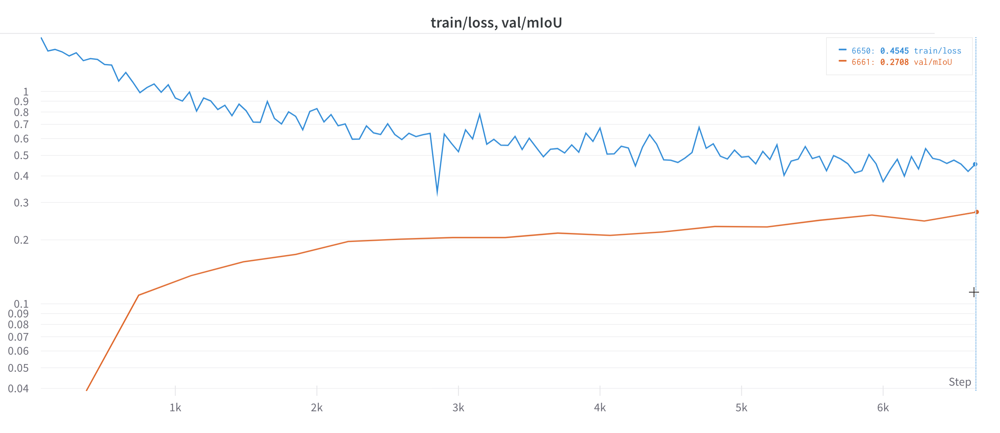

In [22]:
display_tool('https://minio.llycloud.com/image/uPic/image-202206214UNyhU.png')

## 3.4 Evaluate the model

In [8]:
bridge.evaluation_network(
    baseline_config.config_file,
    work_dir=evaluation_dir + baseline_config.model_name,
    load_from=baseline_config.checkpoint_file
)

2022-06-21 20:51:54,892 - mmseg - INFO - Multi-processing start method is `None`
2022-06-21 20:51:54,892 - mmseg - INFO - OpenCV num_threads is `<built-in function getNumThreads>
2022-06-21 20:51:54,894 - mmseg - INFO - Loaded 50 images


load checkpoint from local path: work_dirs/basicnet_8x1_1024x1024_180e_kitti/best_mIoU_epoch_180.pth
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 50/50, 19.2 task/s, elapsed: 3s, ETA:     0s

In [11]:
_ = cal_acc(evaluation_dir + baseline_config.model_name + '/gray/', gt_dir)

Eval result: mIoU 0.2760.


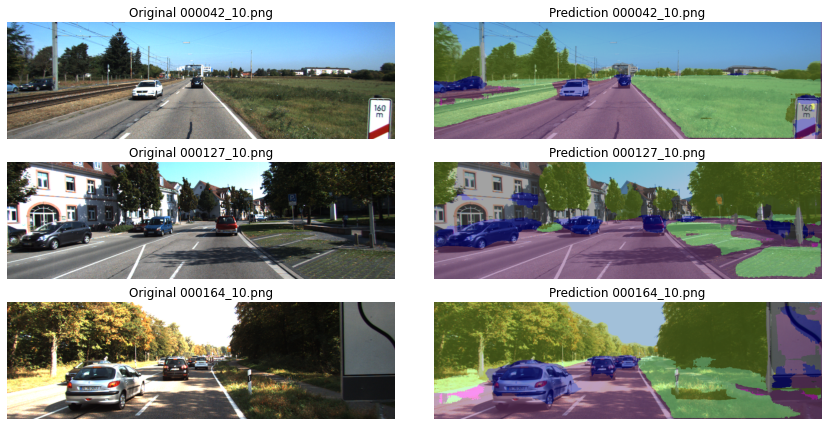

In [44]:
bridge.show_results(evaluation_dir + baseline_config.model_name)

# 4. Baseline 1000 epochs

In [39]:
bridge = GlobalBridgeController()

model_config = bridge.MMSegConfig(
    model_name='baseline_1000',
    config_file='configs/basicNet/basicnet_8x1_1024x1024_1000e_kitti.py',
    checkpoint_url='http://vmv.re/dPgO0'
)

[DEBUG  ] run command: wget -nv http://vmv.re/dPgO0 -O checkpoints/baseline_1000.pth 
[DEBUG  ] -> exit status: 0 
[DEBUG  ] output:  
[DEBUG  ] error: Will not apply HSTS. The HSTS database must be a regular and non-world-writable file.
ERROR: could not open HSTS store at '/home/akide/.wget-hsts'. HSTS will be disabled.
2022-06-22 18:15:38 URL:https://wthy4-my.sharepoint.com/personal/cloudreve_o365_llycloud_com/_layouts/15/download.aspx?UniqueId=57c7b41e-9c0c-44ce-9b4c-4fbc25dcc930&Translate=false&tempauth=eyJ0eXAiOiJKV1QiLCJhbGciOiJub25lIn0.eyJhdWQiOiIwMDAwMDAwMy0wMDAwLTBmZjEtY2UwMC0wMDAwMDAwMDAwMDAvd3RoeTQtbXkuc2hhcmVwb2ludC5jb21ANzNhY2M4ZGItNTIzMC00ODdiLWI5OTUtYjJiOTkwMTE4Mjc2IiwiaXNzIjoiMDAwMDAwMDMtMDAwMC0wZmYxLWNlMDAtMDAwMDAwMDAwMDAwIiwibmJmIjoiMTY1NTg4NzUzNCIsImV4cCI6IjE2NTU4OTExMzQiLCJlbmRwb2ludHVybCI6ImJ0d2JGL3paWEEyY1d3SDYyNkY4T1Q2SmdBcFNleTN2Nk9pdEFvaXhVa1U9IiwiZW5kcG9pbnR1cmxMZW5ndGgiOiIxNTYiLCJpc2xvb3BiYWNrIjoiVHJ1ZSIsImNpZCI6IlpUazROamxrTWpBdE56QXpZUzAwWVRObUxXRXhNemN0WlR

## 4.1 Summarize the model

In [53]:
bridge.summarize_network(
    model_config.config_file, image_shape)

Layer (type:depth-idx)                   Output Shape              Param #
EncoderDecoder                           [1, 19, 375, 1242]        --
├─BasicSegNet: 1-1                       [1, 19, 22, 76]           --
│    └─Conv2d: 2-1                       [1, 64, 375, 1242]        1,792
│    └─ReLU: 2-2                         [1, 64, 375, 1242]        --
│    └─Conv2d: 2-3                       [1, 64, 375, 1242]        36,928
│    └─ReLU: 2-4                         [1, 64, 375, 1242]        --
│    └─MaxPool2d: 2-5                    [1, 64, 188, 621]         --
│    └─Conv2d: 2-6                       [1, 128, 188, 621]        73,856
│    └─ReLU: 2-7                         [1, 128, 188, 621]        --
│    └─MaxPool2d: 2-8                    [1, 128, 94, 311]         --
│    └─Conv2d: 2-9                       [1, 256, 94, 311]         295,168
│    └─ReLU: 2-10                        [1, 256, 94, 311]         --
│    └─MaxPool2d: 2-11                   [1, 256, 47, 156]         --

## 4.2 Training the model

In [ ]:
bridge.train_network(model_config.config_file)

## 4.3 Plot metrics

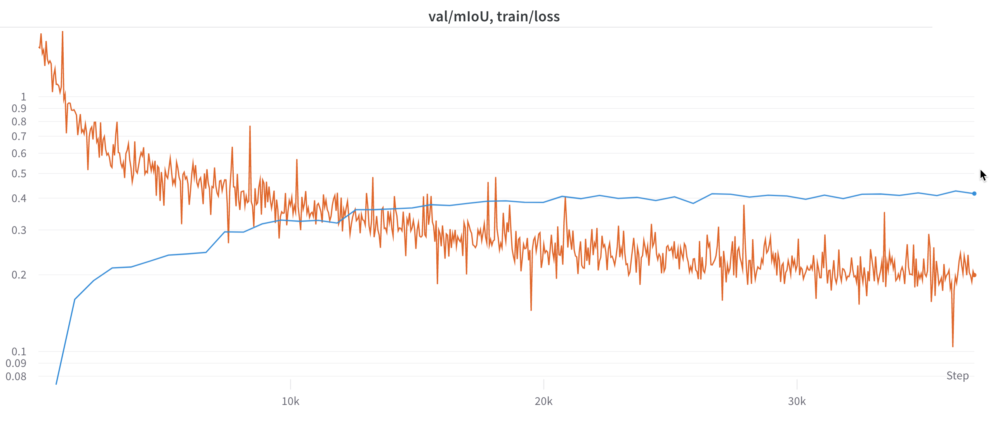

In [48]:
display_tool('https://minio.llycloud.com/image/uPic/image-20220621TtYvz9.png')

## 4.4 Evaluate the model

In [58]:
# generate the evaluation directory with gray and color images
bridge.evaluation_network(
    model_config.config_file,
    work_dir=evaluation_dir + model_config.model_name,
    load_from=model_config.checkpoint_file
)

2022-06-21 23:26:33,318 - mmseg - INFO - Loaded 50 images
INFO:mmseg:Loaded 50 images


load checkpoint from local path: checkpoints/baseline_1000.pth
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 50/50, 19.2 task/s, elapsed: 3s, ETA:     0s

In [59]:
# evaluation result by official cal acc function
_ = cal_acc(evaluation_dir + model_config.model_name + '/gray/', gt_dir)

Eval result: mIoU 0.4271.


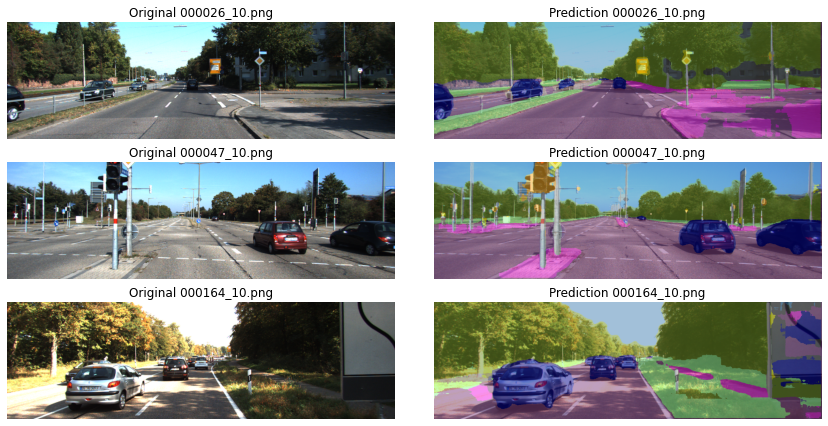

In [60]:
# random select 3 images from the validation set
bridge.show_results(evaluation_dir + model_config.model_name)

# 5. UNet model

In [40]:
bridge = GlobalBridgeController()

model_config = bridge.MMSegConfig(
    model_name='UNet',
    config_file='configs/unet/fcn_unet_s5-d16_4x4_512x1024_160k_kitti.py',
    checkpoint_url='http://vmv.re/bNQi9'
)

[DEBUG  ] run command: wget -nv http://vmv.re/bNQi9 -O checkpoints/UNet.pth 
[DEBUG  ] -> exit status: 0 
[DEBUG  ] output:  
[DEBUG  ] error: Will not apply HSTS. The HSTS database must be a regular and non-world-writable file.
ERROR: could not open HSTS store at '/home/akide/.wget-hsts'. HSTS will be disabled.
2022-06-22 18:15:46 URL:https://wthy4-my.sharepoint.com/personal/cloudreve_o365_llycloud_com/_layouts/15/download.aspx?UniqueId=2e5f58c1-f119-4ac7-9c12-4eddf7309ac6&Translate=false&tempauth=eyJ0eXAiOiJKV1QiLCJhbGciOiJub25lIn0.eyJhdWQiOiIwMDAwMDAwMy0wMDAwLTBmZjEtY2UwMC0wMDAwMDAwMDAwMDAvd3RoeTQtbXkuc2hhcmVwb2ludC5jb21ANzNhY2M4ZGItNTIzMC00ODdiLWI5OTUtYjJiOTkwMTE4Mjc2IiwiaXNzIjoiMDAwMDAwMDMtMDAwMC0wZmYxLWNlMDAtMDAwMDAwMDAwMDAwIiwibmJmIjoiMTY1NTg4NzUzOSIsImV4cCI6IjE2NTU4OTExMzkiLCJlbmRwb2ludHVybCI6IlIwMzF3cCtHaXROSWpRaFVYS0JKU3Y2MkN6Zk0wVEUzMnBoaGNiVDVJbGM9IiwiZW5kcG9pbnR1cmxMZW5ndGgiOiIxNTYiLCJpc2xvb3BiYWNrIjoiVHJ1ZSIsImNpZCI6IlpEY3hORGsyTUdZdE5EUTVZeTAwTkdNekxXSXdPVFl0T1dReU9UVXhN

## 5.1 Summarize the model

In [83]:
bridge.summarize_network(
    model_config.config_file, [368,1248])

Layer (type:depth-idx)                                  Output Shape              Param #
EncoderDecoder                                          [1, 19, 368, 1248]        --
├─UNet: 1-1                                             [1, 1024, 23, 78]         --
│    └─ModuleList: 2-1                                  --                        --
│    │    └─Sequential: 3-1                             [1, 64, 368, 1248]        38,848
│    │    └─Sequential: 3-2                             [1, 128, 184, 624]        221,696
│    │    └─Sequential: 3-3                             [1, 256, 92, 312]         885,760
│    │    └─Sequential: 3-4                             [1, 512, 46, 156]         3,540,992
│    │    └─Sequential: 3-5                             [1, 1024, 23, 78]         14,159,872
│    └─ModuleList: 2-2                                  --                        525,056
│    │    └─UpConvBlock: 3-11                           [1, 512, 46, 156]         (recursive)
│    │    └─UpCon

## 5.2 Training the model

In [ ]:
bridge.train_network(model_config.config_file)

## 5.3 Plot metrics

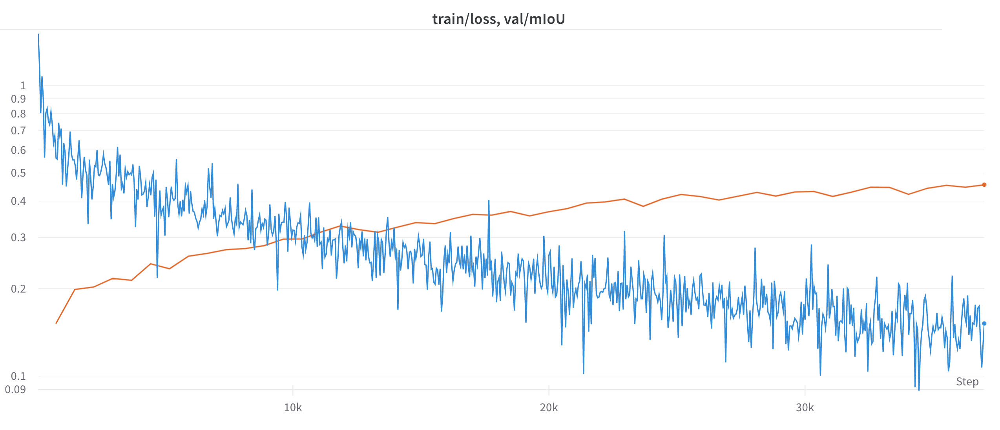

In [84]:
display_tool('https://minio.llycloud.com/image/uPic/image-20220621fg4DcN.png')

## 5.4 Evaluate the model

In [85]:
# generate the evaluation directory with gray and color images
bridge.evaluation_network(
    model_config.config_file,
    work_dir=evaluation_dir + model_config.model_name,
    load_from=model_config.checkpoint_file
)

2022-06-22 00:00:26,123 - mmseg - INFO - Loaded 50 images
INFO:mmseg:Loaded 50 images


load checkpoint from local path: checkpoints/UNet.pth
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 50/50, 12.1 task/s, elapsed: 4s, ETA:     0s

In [86]:
# evaluation result by official cal acc function
_ = cal_acc(evaluation_dir + model_config.model_name + '/gray/', gt_dir)

Eval result: mIoU 0.4613.


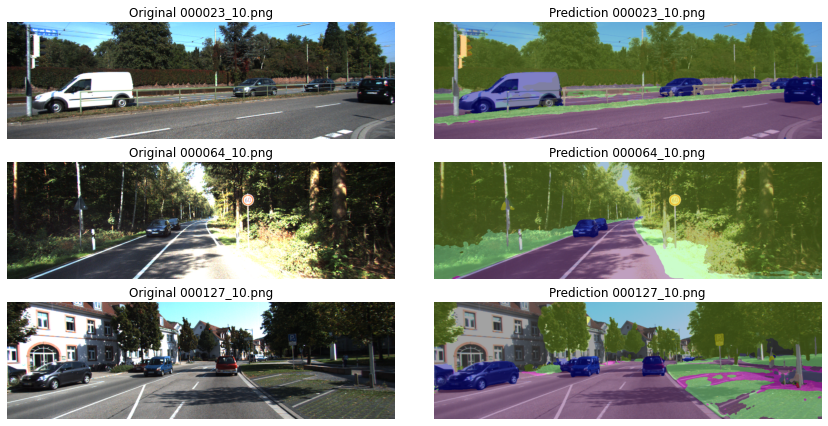

In [87]:
# random select 3 images from the validation set
bridge.show_results(evaluation_dir + model_config.model_name)

# 6. DeeplabV3plus + Resnet101

In [41]:
bridge = GlobalBridgeController()

model_config = bridge.MMSegConfig(
    model_name='DeeplabV3plus_Resnet101',
    config_file='configs/deeplabv3plus/deeplabv3plus_r101-d8_512x1024_40k_kitti.py',
    checkpoint_url='http://vmv.re/Teioj'
)

[DEBUG  ] run command: wget -nv http://vmv.re/Teioj -O checkpoints/DeeplabV3plus_Resnet101.pth 
[DEBUG  ] -> exit status: 0 
[DEBUG  ] output:  
[DEBUG  ] error: Will not apply HSTS. The HSTS database must be a regular and non-world-writable file.
ERROR: could not open HSTS store at '/home/akide/.wget-hsts'. HSTS will be disabled.
2022-06-22 18:15:58 URL:https://wthy4-my.sharepoint.com/personal/cloudreve_o365_llycloud_com/_layouts/15/download.aspx?UniqueId=6f840987-da71-4c27-958d-b640f92a9900&Translate=false&tempauth=eyJ0eXAiOiJKV1QiLCJhbGciOiJub25lIn0.eyJhdWQiOiIwMDAwMDAwMy0wMDAwLTBmZjEtY2UwMC0wMDAwMDAwMDAwMDAvd3RoeTQtbXkuc2hhcmVwb2ludC5jb21ANzNhY2M4ZGItNTIzMC00ODdiLWI5OTUtYjJiOTkwMTE4Mjc2IiwiaXNzIjoiMDAwMDAwMDMtMDAwMC0wZmYxLWNlMDAtMDAwMDAwMDAwMDAwIiwibmJmIjoiMTY1NTg4NzU0NyIsImV4cCI6IjE2NTU4OTExNDciLCJlbmRwb2ludHVybCI6Imp2ZXdBbmxnWWdTVlRIZTdkQUxXQ005WDUzM2wwQ1VPZmM5UEhBV1d6YWc9IiwiZW5kcG9pbnR1cmxMZW5ndGgiOiIxNTYiLCJpc2xvb3BiYWNrIjoiVHJ1ZSIsImNpZCI6Ik5UQmpNRGt3WmprdE1UUmhOUzAwWkRJeExUb

## 6.1 Summarize the model

In [89]:
bridge.summarize_network(
    model_config.config_file, image_shape)

Layer (type:depth-idx)                             Output Shape              Param #
EncoderDecoder                                     [1, 19, 375, 1242]        17,697,923
├─ResNetV1c: 1-1                                   [1, 256, 94, 311]         --
│    └─Sequential: 2-1                             [1, 64, 188, 621]         --
│    │    └─Conv2d: 3-1                            [1, 32, 188, 621]         864
│    │    └─SyncBatchNorm: 3-2                     [1, 32, 188, 621]         64
│    │    └─ReLU: 3-3                              [1, 32, 188, 621]         --
│    │    └─Conv2d: 3-4                            [1, 32, 188, 621]         9,216
│    │    └─SyncBatchNorm: 3-5                     [1, 32, 188, 621]         64
│    │    └─ReLU: 3-6                              [1, 32, 188, 621]         --
│    │    └─Conv2d: 3-7                            [1, 64, 188, 621]         18,432
│    │    └─SyncBatchNorm: 3-8                     [1, 64, 188, 621]         128
│    │    └─ReLU: 

## 6.2 Training the model

In [ ]:
bridge.train_network(model_config.config_file)

## 6.3 Plot metrics

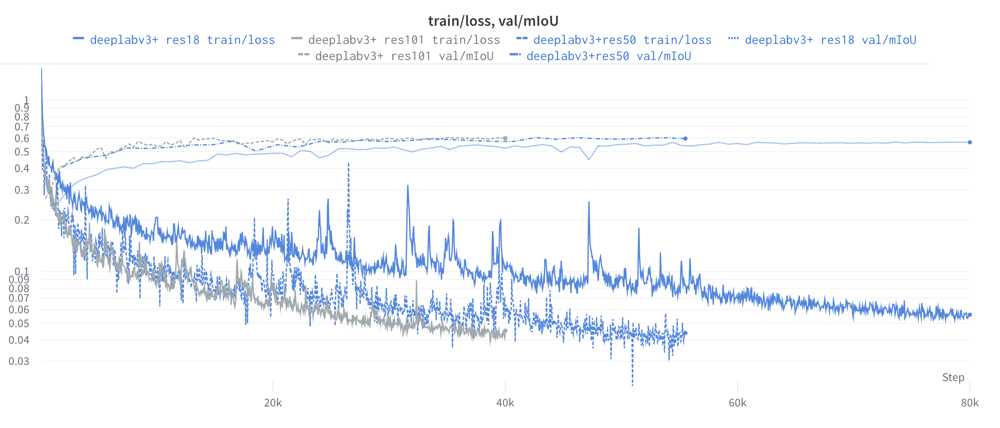

In [90]:
display_tool('https://minio.llycloud.com/image/uPic/image-20220622CSZVNV.png')

## 6.4 Evaluate the model

In [91]:
# generate the evaluation directory with gray and color images
bridge.evaluation_network(
    model_config.config_file,
    work_dir=evaluation_dir + model_config.model_name,
    load_from=model_config.checkpoint_file
)

2022-06-22 00:13:57,690 - mmseg - INFO - Loaded 50 images
INFO:mmseg:Loaded 50 images


load checkpoint from local path: checkpoints/DeeplabV3plus_Resnet101.pth
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 50/50, 9.8 task/s, elapsed: 5s, ETA:     0s

In [92]:
# evaluation result by official cal acc function
_ = cal_acc(evaluation_dir + model_config.model_name + '/gray/', gt_dir)

Eval result: mIoU 0.6030.


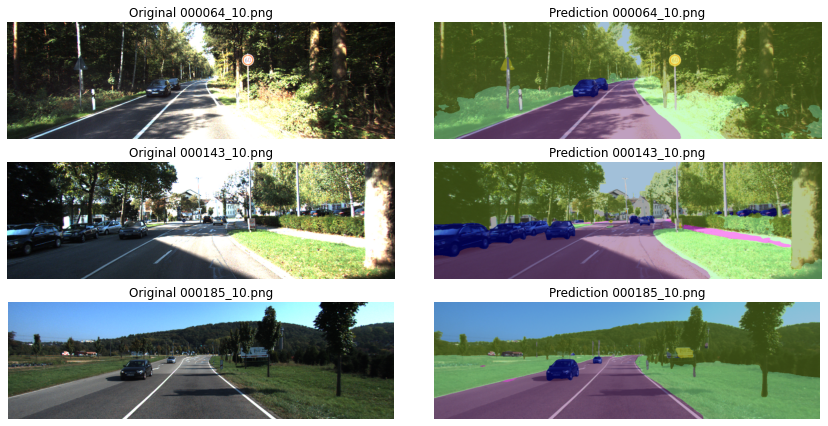

In [93]:
# random select 3 images from the validation set
bridge.show_results(evaluation_dir + model_config.model_name)

# 7. Swin v1 Tiny 22k + Segformer

In [42]:
bridge = GlobalBridgeController()

model_config = bridge.MMSegConfig(
    model_name='Segformer_Swin',
    config_file='configs/segformer/segformer_swin_4x2_1024x1024_160k_kitti.py',
    checkpoint_url='http://vmv.re/CPUJM'
)

[DEBUG  ] run command: wget -nv http://vmv.re/CPUJM -O checkpoints/Segformer_Swin.pth 
[DEBUG  ] -> exit status: 0 
[DEBUG  ] output:  
[DEBUG  ] error: Will not apply HSTS. The HSTS database must be a regular and non-world-writable file.
ERROR: could not open HSTS store at '/home/akide/.wget-hsts'. HSTS will be disabled.
2022-06-22 18:16:06 URL:https://wthy4-my.sharepoint.com/personal/cloudreve_o365_llycloud_com/_layouts/15/download.aspx?UniqueId=1a98c322-cae5-4ed8-b1aa-563159508851&Translate=false&tempauth=eyJ0eXAiOiJKV1QiLCJhbGciOiJub25lIn0.eyJhdWQiOiIwMDAwMDAwMy0wMDAwLTBmZjEtY2UwMC0wMDAwMDAwMDAwMDAvd3RoeTQtbXkuc2hhcmVwb2ludC5jb21ANzNhY2M4ZGItNTIzMC00ODdiLWI5OTUtYjJiOTkwMTE4Mjc2IiwiaXNzIjoiMDAwMDAwMDMtMDAwMC0wZmYxLWNlMDAtMDAwMDAwMDAwMDAwIiwibmJmIjoiMTY1NTg4NzU1OSIsImV4cCI6IjE2NTU4OTExNTkiLCJlbmRwb2ludHVybCI6IktTWGJOeFdXdHZPYnYvQklFUFlxWjFwbjVxWUtBTWxVaTNPdnFIWXhRWG89IiwiZW5kcG9pbnR1cmxMZW5ndGgiOiIxNTYiLCJpc2xvb3BiYWNrIjoiVHJ1ZSIsImNpZCI6IllXVXhPVFl4TkdFdE56ZzVaQzAwT1RabUxXSmlOVFV0TU

## 7.1 Summarize the model

In [100]:
bridge.summarize_network(
    model_config.config_file, image_shape, True)

| module                             | #parameters or shape   | #flops     |
|:-----------------------------------|:-----------------------|:-----------|
| model                              | 29.321M                | 79.472G    |
|  backbone                          |  27.521M               |  45.479G   |
|   backbone.patch_embed             |   4.896K               |   0.149G   |
|    backbone.patch_embed.projection |    4.704K              |    0.135G  |
|    backbone.patch_embed.norm       |    0.192K              |    14.032M |
|   backbone.stages                  |   27.513M              |   45.304G  |
|    backbone.stages.0               |    0.299M              |    7.778G  |
|    backbone.stages.1               |    1.188M              |    7.535G  |
|    backbone.stages.2               |    11.842M             |    22.703G |
|    backbone.stages.3.blocks        |    14.184M             |    7.287G  |
|   backbone.norm0                   |   0.192K               |   14.032M  |

## 7.2 Training the model

In [ ]:
bridge.train_network(model_config.config_file)

## 7.3 Plot metrics

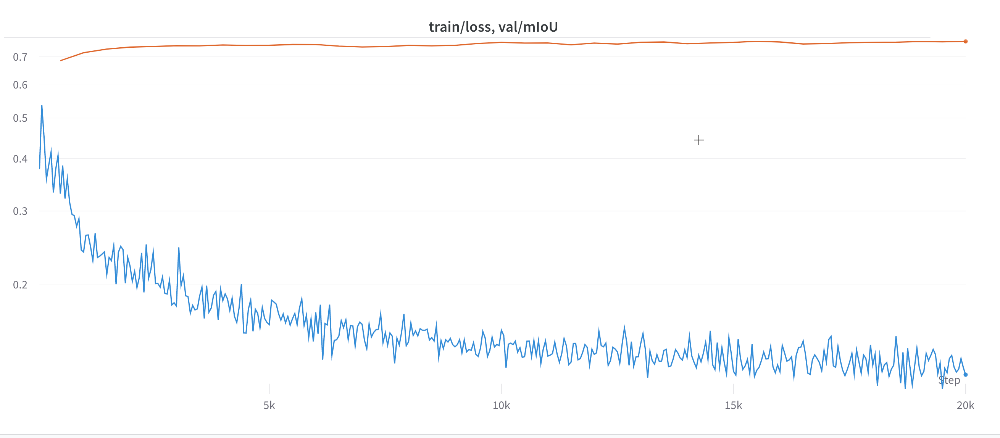

In [101]:
display_tool('https://minio.llycloud.com/image/uPic/image-202206220hSgcQ.png')

## 7.4 Evaluate the model

In [105]:
# generate the evaluation directory with gray and color images
bridge.evaluation_network(
    model_config.config_file,
    work_dir=evaluation_dir + model_config.model_name,
    load_from=model_config.checkpoint_file,
    multi_scale=True
)

2022-06-22 00:30:54,890 - mmseg - INFO - Loaded 50 images
INFO:mmseg:Loaded 50 images


load checkpoint from local path: checkpoints/Segformer_Swin.pth
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 50/50, 2.8 task/s, elapsed: 18s, ETA:     0s

In [106]:
# evaluation result by official cal acc function
_ = cal_acc(evaluation_dir + model_config.model_name + '/gray/', gt_dir)

Eval result: mIoU 0.7628.


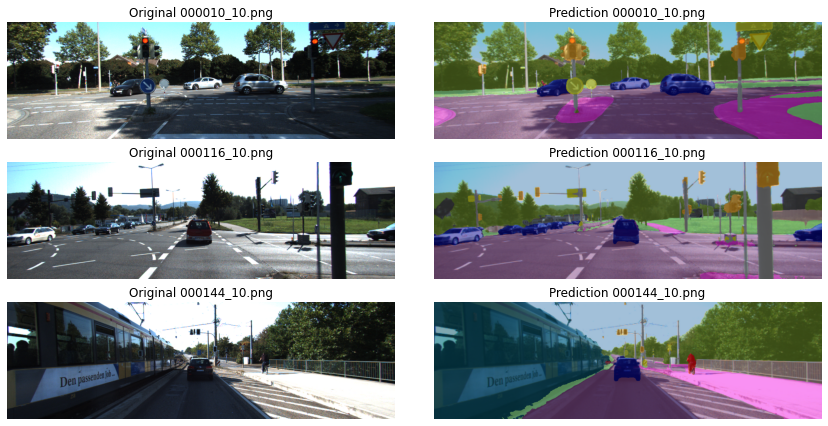

In [107]:
# random select 3 images from the validation set
bridge.show_results(evaluation_dir + model_config.model_name)

# 8. Segformer B0

In [43]:
bridge = GlobalBridgeController()

model_config = bridge.MMSegConfig(
    model_name='Segformer_B0',
    config_file='configs/segformer/segformer_mit-b0_8x1_1024x1024_160k_kitti.py',
    checkpoint_url='http://vmv.re/910Yk'
)

[DEBUG  ] run command: wget -nv http://vmv.re/910Yk -O checkpoints/Segformer_B0.pth 
[DEBUG  ] -> exit status: 0 
[DEBUG  ] output:  
[DEBUG  ] error: Will not apply HSTS. The HSTS database must be a regular and non-world-writable file.
ERROR: could not open HSTS store at '/home/akide/.wget-hsts'. HSTS will be disabled.
2022-06-22 18:16:09 URL:https://wthy4-my.sharepoint.com/personal/cloudreve_o365_llycloud_com/_layouts/15/download.aspx?UniqueId=d90d766b-2ce6-4ba5-8df8-fc7f617cfabc&Translate=false&tempauth=eyJ0eXAiOiJKV1QiLCJhbGciOiJub25lIn0.eyJhdWQiOiIwMDAwMDAwMy0wMDAwLTBmZjEtY2UwMC0wMDAwMDAwMDAwMDAvd3RoeTQtbXkuc2hhcmVwb2ludC5jb21ANzNhY2M4ZGItNTIzMC00ODdiLWI5OTUtYjJiOTkwMTE4Mjc2IiwiaXNzIjoiMDAwMDAwMDMtMDAwMC0wZmYxLWNlMDAtMDAwMDAwMDAwMDAwIiwibmJmIjoiMTY1NTg4NzU2OCIsImV4cCI6IjE2NTU4OTExNjgiLCJlbmRwb2ludHVybCI6InlFcFdOczBRcngxQ1hkeUh0czhRU1hjSFBkVWRuVXBYakJWekNpc0tDMXc9IiwiZW5kcG9pbnR1cmxMZW5ndGgiOiIxNTYiLCJpc2xvb3BiYWNrIjoiVHJ1ZSIsImNpZCI6Ik1qaGlaR013TURNdFpqZzVZeTAwTVdWaExXRTFZamt0WkRK

## 8.1 Summarize the model

In [114]:
bridge.summarize_network(
    model_config.config_file, image_shape, True)

| module                          | #parameters or shape   | #flops     |
|:--------------------------------|:-----------------------|:-----------|
| model                           | 3.72M                  | 15.579G    |
|  backbone.layers                |  3.319M                |  7.117G    |
|   backbone.layers.0             |   0.164M               |   2.452G   |
|    backbone.layers.0.0          |    4.8K                |    0.142G  |
|    backbone.layers.0.1          |    0.159M              |    2.306G  |
|    backbone.layers.0.2          |    64                  |    4.677M  |
|   backbone.layers.1             |   0.255M               |   1.652G   |
|    backbone.layers.1.0          |    18.624K             |    0.137G  |
|    backbone.layers.1.1          |    0.237M              |    1.513G  |
|    backbone.layers.1.2          |    0.128K              |    2.346M  |
|   backbone.layers.2             |   0.93M                |   1.867G   |
|    backbone.layers.2.0          |   

## 8.2 Training the model

In [ ]:
bridge.train_network(model_config.config_file)

## 8.3 Plot metrics

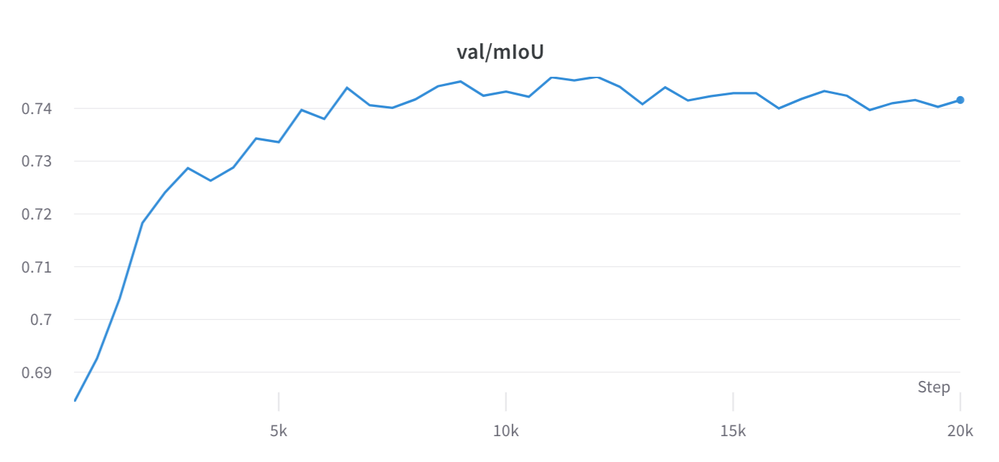

In [116]:
display_tool('https://minio.llycloud.com/image/uPic/image-202206226CoKT5.png')

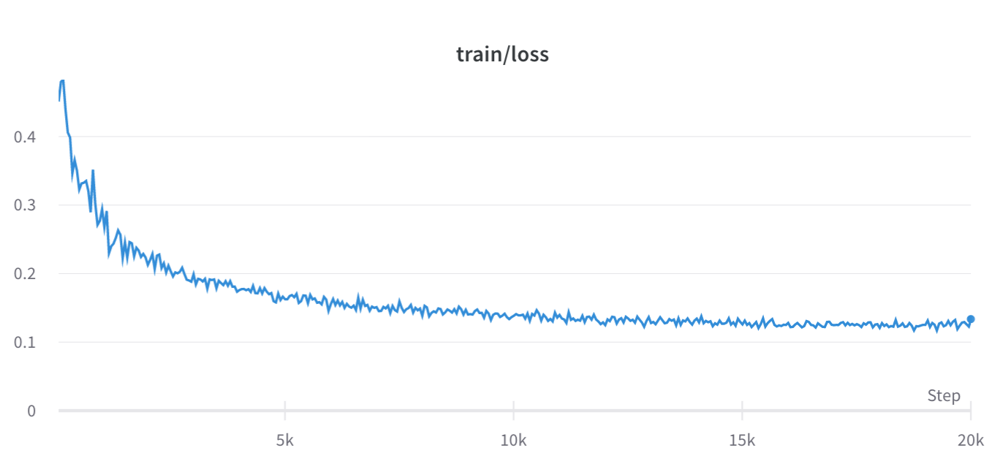

In [117]:
display_tool('https://minio.llycloud.com/image/uPic/image-20220622RUwEr7.png')

## 8.4 Evaluate the model

In [118]:
# generate the evaluation directory with gray and color images
bridge.evaluation_network(
    model_config.config_file,
    work_dir=evaluation_dir + model_config.model_name,
    load_from=model_config.checkpoint_file,
    multi_scale=True
)

2022-06-22 00:51:21,607 - mmseg - INFO - Loaded 50 images
INFO:mmseg:Loaded 50 images


load checkpoint from local path: checkpoints/Segformer_B0.pth
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 50/50, 4.3 task/s, elapsed: 12s, ETA:     0s

In [119]:
# evaluation result by official cal acc function
_ = cal_acc(evaluation_dir + model_config.model_name + '/gray/', gt_dir)

Eval result: mIoU 0.7460.


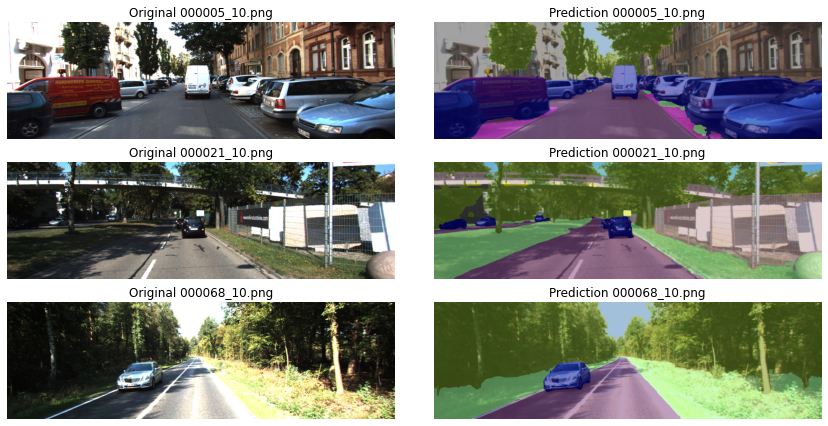

In [120]:
# random select 3 images from the validation set
bridge.show_results(evaluation_dir + model_config.model_name)

# 9. Segformer B2 FOR FINAL COMPETITION

In [24]:
bridge = GlobalBridgeController()

model_config = bridge.MMSegConfig(
    model_name='Segformer_B2',
    config_file='configs/segformer/segformer_mit-b2_8x1_1024x1024_160k_kitti.py',
    checkpoint_url='http://vmv.re/W9ldy'
)

[DEBUG  ] run command: wget -nv http://vmv.re/W9ldy -O checkpoints/Segformer_B2.pth 
[DEBUG  ] -> exit status: 0 
[DEBUG  ] output:  
[DEBUG  ] error: Will not apply HSTS. The HSTS database must be a regular and non-world-writable file.
ERROR: could not open HSTS store at '/home/akide/.wget-hsts'. HSTS will be disabled.
2022-06-23 23:05:34 URL:https://wthy4-my.sharepoint.com/personal/cloudreve_o365_llycloud_com/_layouts/15/download.aspx?UniqueId=fa9db885-7311-412f-ae54-ff9bdb3d6e7e&Translate=false&tempauth=eyJ0eXAiOiJKV1QiLCJhbGciOiJub25lIn0.eyJhdWQiOiIwMDAwMDAwMy0wMDAwLTBmZjEtY2UwMC0wMDAwMDAwMDAwMDAvd3RoeTQtbXkuc2hhcmVwb2ludC5jb21ANzNhY2M4ZGItNTIzMC00ODdiLWI5OTUtYjJiOTkwMTE4Mjc2IiwiaXNzIjoiMDAwMDAwMDMtMDAwMC0wZmYxLWNlMDAtMDAwMDAwMDAwMDAwIiwibmJmIjoiMTY1NTk5MTMyOCIsImV4cCI6IjE2NTU5OTQ5MjgiLCJlbmRwb2ludHVybCI6InE4ekxPdmdJd1pQZ0QzQ1lqczdZU3UzRnVFOVNQbFA0bkRvTWNBRGJSTnc9IiwiZW5kcG9pbnR1cmxMZW5ndGgiOiIxNTYiLCJpc2xvb3BiYWNrIjoiVHJ1ZSIsImNpZCI6Ik1qTmtZelEwWm1ZdE4yRTVNUzAwWmpka0xXRmpPVEF0WldK

## 9.1 Summarize the model

In [9]:
bridge.summarize_network(
    model_config.config_file, image_shape, True)

| module                            | #parameters or shape   | #flops     |
|:----------------------------------|:-----------------------|:-----------|
| model                             | 25.471M                | 50.633G    |
|  backbone.layers                  |  24.196M               |  41.704G   |
|   backbone.layers.0               |   0.954M               |   9.176G   |
|    backbone.layers.0.0            |    9.6K                |    0.284G  |
|    backbone.layers.0.1            |    0.945M              |    8.882G  |
|    backbone.layers.0.2            |    0.128K              |    9.355M  |
|   backbone.layers.1               |   1.938M               |   9.256G   |
|    backbone.layers.1.0            |    74.112K             |    0.545G  |
|    backbone.layers.1.1            |    1.864M              |    8.706G  |
|    backbone.layers.1.2            |    0.256K              |    4.692M  |
|   backbone.layers.2               |   10.308M              |   17.457G  |
|    backbon

## 9.2 Training the model

In [18]:
bridge.train_network(model_config.config_file)

2022-06-23 04:52:39,404 - mmseg - INFO - Multi-processing start method is `None`
2022-06-23 04:52:39,404 - mmseg - INFO - OpenCV num_threads is `<built-in function getNumThreads>
2022-06-23 04:52:39,404 - mmseg - INFO - OMP num threads is 1
2022-06-23 04:52:39,418 - mmseg - INFO - Environment info:
------------------------------------------------------------
sys.platform: linux
Python: 3.10.4 (main, Mar 31 2022, 08:41:55) [GCC 7.5.0]
CUDA available: True
GPU 0,1,2,3: NVIDIA RTX A5000
CUDA_HOME: /usr/local/cuda
NVCC: Cuda compilation tools, release 11.3, V11.3.109
GCC: gcc (Ubuntu 9.3.0-17ubuntu1~20.04) 9.3.0
PyTorch: 1.11.0
PyTorch compiling details: PyTorch built with:
  - GCC 7.3
  - C++ Version: 201402
  - Intel(R) oneAPI Math Kernel Library Version 2021.4-Product Build 20210904 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.5.2 (Git Hash a9302535553c73243c632ad3c4c80beec3d19a1e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)

## 9.3 Plot metrics

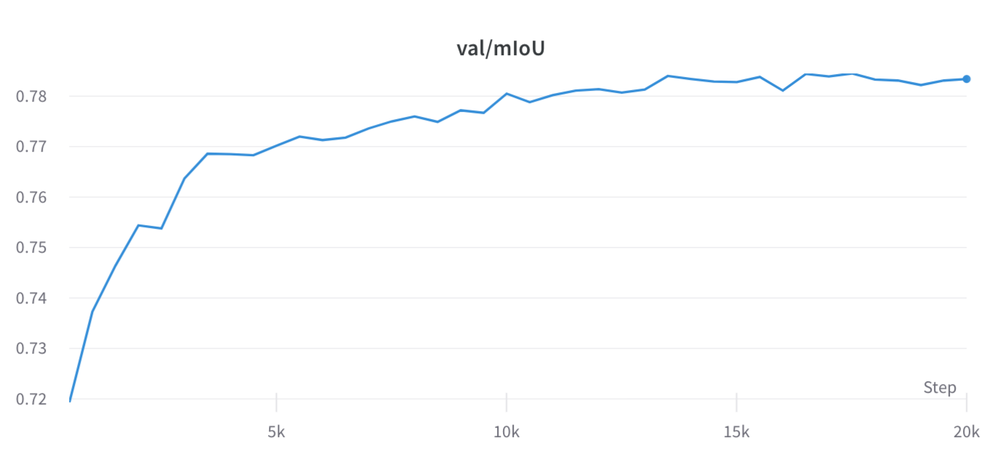

In [16]:
display_tool('https://minio.llycloud.com/image/uPic/image-20220623LSNDxe.png')

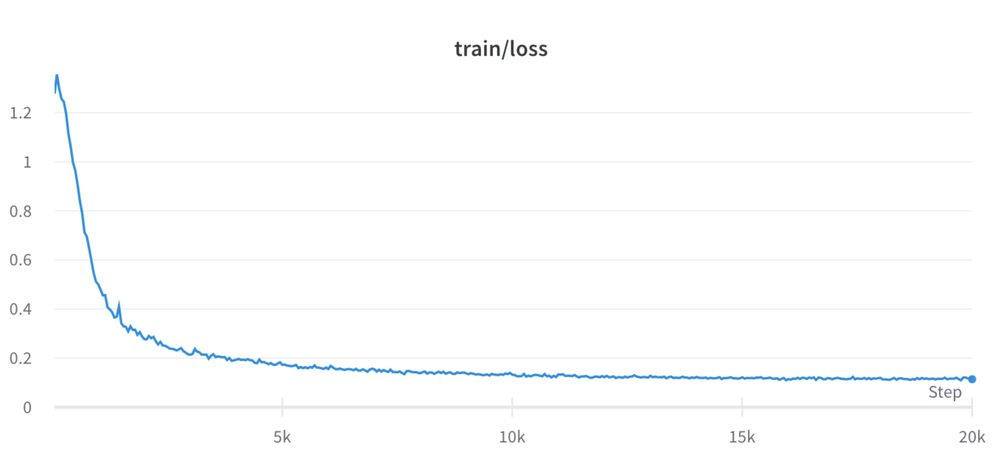

In [17]:
display_tool('https://minio.llycloud.com/image/uPic/image-20220623NsVnpC.png')

## 9.4 Evaluate the model

In [13]:
# generate the evaluation directory with gray and color images
bridge.evaluation_network(
    model_config.config_file,
    work_dir=evaluation_dir + model_config.model_name,
    load_from=model_config.checkpoint_file,
    multi_scale=True
)

2022-06-23 17:48:29,514 - mmseg - INFO - Loaded 50 images


load checkpoint from local path: checkpoints/Segformer_B2.pth
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 50/50, 2.3 task/s, elapsed: 22s, ETA:     0s

In [14]:
# evaluation result by official cal acc function
_ = cal_acc(evaluation_dir + model_config.model_name + '/gray/', gt_dir)

Eval result: mIoU 0.7845.


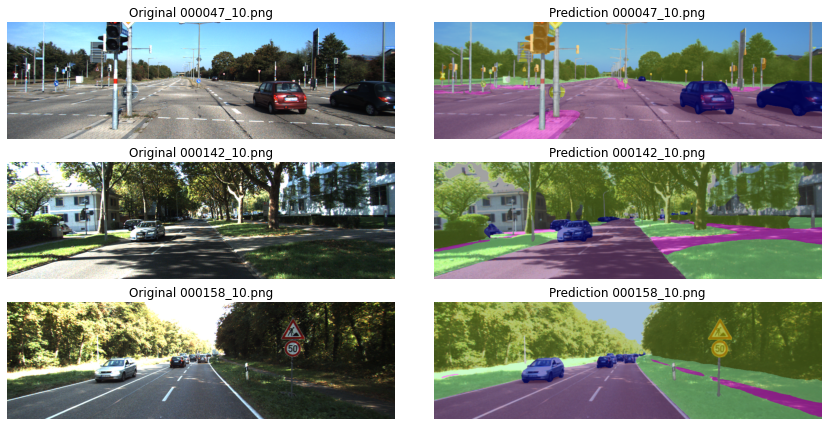

In [15]:
# random select 3 images from the validation set
bridge.show_results(evaluation_dir + model_config.model_name)

# 10. Segformer B5 Best Performance

In [45]:
bridge = GlobalBridgeController()

model_config = bridge.MMSegConfig(
    model_name='Segformer_B5',
    config_file='configs/segformer/segformer_mit-b5_8x1_1024x1024_160k_kitti.py',
    checkpoint_url='http://vmv.re/vUwvf'
)

[DEBUG  ] run command: wget -nv http://vmv.re/vUwvf -O checkpoints/Segformer_B5.pth 
[DEBUG  ] -> exit status: 0 
[DEBUG  ] output:  
[DEBUG  ] error: Will not apply HSTS. The HSTS database must be a regular and non-world-writable file.
ERROR: could not open HSTS store at '/home/akide/.wget-hsts'. HSTS will be disabled.
2022-06-22 18:16:32 URL:https://wthy4-my.sharepoint.com/personal/cloudreve_o365_llycloud_com/_layouts/15/download.aspx?UniqueId=9f960dae-940b-465a-833e-74e5d2aabdc6&Translate=false&tempauth=eyJ0eXAiOiJKV1QiLCJhbGciOiJub25lIn0.eyJhdWQiOiIwMDAwMDAwMy0wMDAwLTBmZjEtY2UwMC0wMDAwMDAwMDAwMDAvd3RoeTQtbXkuc2hhcmVwb2ludC5jb21ANzNhY2M4ZGItNTIzMC00ODdiLWI5OTUtYjJiOTkwMTE4Mjc2IiwiaXNzIjoiMDAwMDAwMDMtMDAwMC0wZmYxLWNlMDAtMDAwMDAwMDAwMDAwIiwibmJmIjoiMTY1NTg4NzU3NiIsImV4cCI6IjE2NTU4OTExNzYiLCJlbmRwb2ludHVybCI6Im4rOEFIS1cvUG45TTVRV2lBY0ZYMVRNQUFmZkhFbEhUdFR1RHI3OGZibGc9IiwiZW5kcG9pbnR1cmxMZW5ndGgiOiIxNTYiLCJpc2xvb3BiYWNrIjoiVHJ1ZSIsImNpZCI6IlpUTmtPVGMyTVdJdE9UTXdNeTAwTmpJMUxXSXdPVEl0WXpG

## 10.1 Summarize the model

In [139]:
bridge.summarize_network(
    model_config.config_file, image_shape, True)

| module                          | #parameters or shape   | #flops     |
|:--------------------------------|:-----------------------|:-----------|
| model                           | 81.975M                | 0.15T      |
|  backbone.layers                |  81.443M               |  0.141T    |
|   backbone.layers.0             |   0.954M               |   9.176G   |
|    backbone.layers.0.0          |    9.6K                |    0.284G  |
|    backbone.layers.0.1          |    0.945M              |    8.882G  |
|    backbone.layers.0.2          |    0.128K              |    9.355M  |
|   backbone.layers.1             |   2.87M                |   13.609G  |
|    backbone.layers.1.0          |    74.112K             |    0.545G  |
|    backbone.layers.1.1          |    2.796M              |    13.059G |
|    backbone.layers.1.2          |    0.256K              |    4.692M  |
|   backbone.layers.2             |   66.623M              |   0.112T   |
|    backbone.layers.2.0          |   

## 10.2 Training the model

In [ ]:
bridge.train_network(model_config.config_file)

## 10.3 Plot metrics

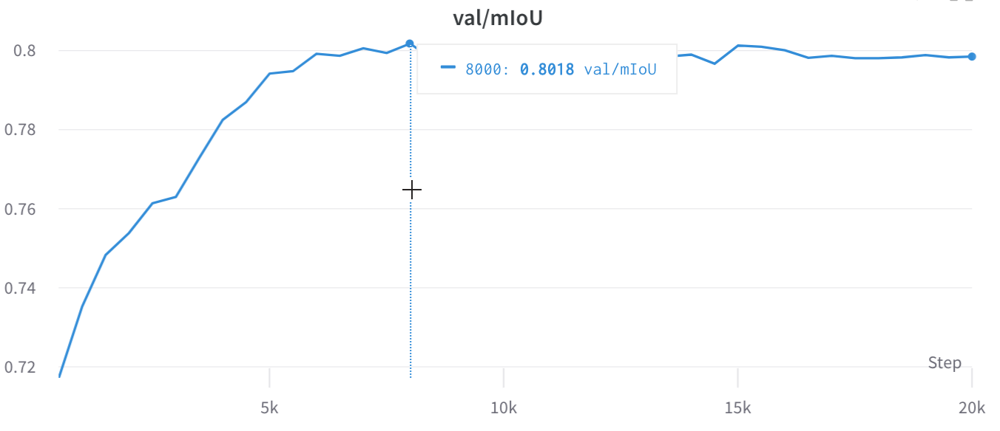

In [140]:
display_tool('https://minio.llycloud.com/image/uPic/image-20220622Bfx4fv.png')

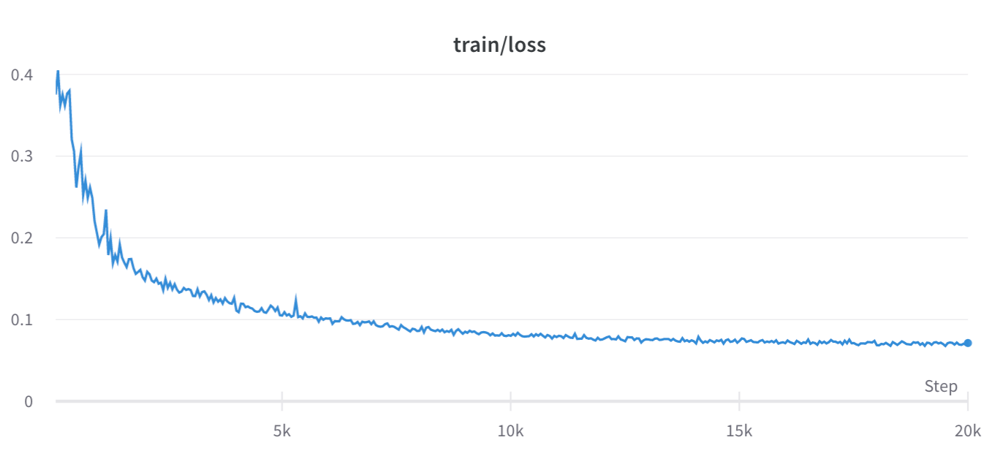

In [141]:
display_tool('https://minio.llycloud.com/image/uPic/image-20220622DTVT1A.png')

## 10.4 Evaluate the model

In [142]:
# generate the evaluation directory with gray and color images# generate the evaluation directory with gray and color images
bridge.evaluation_network(
    model_config.config_file,
    work_dir=evaluation_dir + model_config.model_name,
    load_from=model_config.checkpoint_file,
    multi_scale=True
)

2022-06-22 01:07:59,764 - mmseg - INFO - Loaded 50 images
INFO:mmseg:Loaded 50 images


load checkpoint from local path: checkpoints/Segformer_B5.pth
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 50/50, 1.0 task/s, elapsed: 51s, ETA:     0s

In [143]:
# evaluation result by official cal acc function
_ = cal_acc(evaluation_dir + model_config.model_name + '/gray/', gt_dir)

Eval result: mIoU 0.8019.


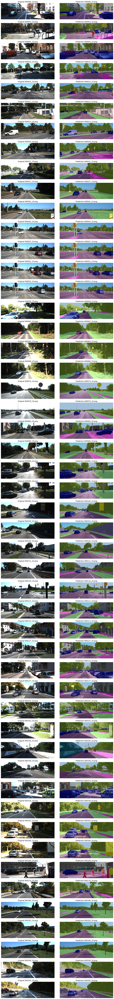

In [144]:
# display all the results
bridge.show_results(evaluation_dir + model_config.model_name, show_all=True)

In [20]:
  #The code from https://cloudstor.aarnet.edu.au/plus/s/PcSc67ZncTSQP0E can be used to count flops
#Download the code.
!wget -c https://cloudstor.aarnet.edu.au/plus/s/hXo1dK9SZqiEVn9/download
!mv download FLOPs_counter.py

Will not apply HSTS. The HSTS database must be a regular and non-world-writable file.
ERROR: could not open HSTS store at '/home/akide/.wget-hsts'. HSTS will be disabled.
--2022-06-22 17:55:23--  https://cloudstor.aarnet.edu.au/plus/s/hXo1dK9SZqiEVn9/download
Resolving cloudstor.aarnet.edu.au (cloudstor.aarnet.edu.au)... 202.158.207.20
Connecting to cloudstor.aarnet.edu.au (cloudstor.aarnet.edu.au)|202.158.207.20|:443... connected.
HTTP request sent, awaiting response... 200 OK
Syntax error in Set-Cookie: 5230042dc1897=sf10s49hh34f227r7ia60dhc1f; path=/plus;; Secure at position 53.
Syntax error in Set-Cookie: oc_sessionPassphrase=B%2BlMI4UitjNsVv74oKQchTgTkkYofofRIGYNhicdikAzKBxJdttwnXjY9Yr2%2BiwhuS5IfpUvPTrcH2Qqid5VzxicC%2F%2FHhbkBIiFnJg8i08rkRTJ4C%2F3D9oWVXgR%2FXf7r; path=/plus;; Secure at position 174.
Length: 5201 (5.1K) [text/x-python]
Saving to: ‘download’

download            100%[===================>]   5.08K  --.-KB/s    in 0s      

2022-06-22 17:55:23 (2.44 GB/s) - ‘download

# 11. FLOPs for Segformer B2

In [19]:
from FLOPs_counter import print_model_parm_flops

bridge = GlobalBridgeController()

model_config = bridge.MMSegConfig(
    model_name='Segformer_B2',
    config_file='configs/segformer/segformer_mit-b2_8x1_1024x1024_160k_kitti.py',
    checkpoint_url='http://vmv.re/soVRA'
)

#
input = torch.randn(1, 3, 375, 1242).to('cuda')  # Modifying the size (3, 375, 1242) is ***NOT*** allowed.

model = bridge.get_network(model_config.config_file)

#Get the network and its FLOPs
print_model_parm_flops(model, input, detail=False)

checkpoint file already exists at checkpoints/Segformer_B2.pth
 + Number of FLOPs: 63.89G


In [21]:
import glob

outputs = glob.glob('bridge/*')
# outputs.append('download.sh')
import jovian

jovian.commit(project='akide/cv_competition_segmentation',
              outputs=outputs,
              new_project=False,
              environment='auto')

<IPython.core.display.Javascript object>

[jovian] Updating notebook "akide/cv-competition-segmentation" on https://jovian.ai/
[jovian] Capturing environment..
[jovian] Uploading additional outputs...
[jovian] Committed successfully! https://jovian.ai/akide/cv-competition-segmentation


'https://jovian.ai/akide/cv-competition-segmentation'